# Face Mask detection using YOLOv5 in Pytorch

### Get dataset from Kaggle to Colab

refer: https://www.kaggle.com/general/74235



In [ ]:
# select kaggle.json file, downloaded from your kaggle account
from google.colab import files
files.upload()

In [ ]:
!mkdir ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!pip install -q kaggle
!kaggle datasets download -d wobotintelligence/face-mask-detection-dataset
!unzip face-mask-detection-dataset.zip -d facemask

### Get YOLOv5 repository

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
!pip install -U PyYAML

In [ ]:
%ls

In [ ]:
%cd yolov5

## Prepare custom dataset

In [ ]:
import yaml
from tqdm import tqdm
import numpy as np
import os
import pandas as pd
import cv2
import shutil
from google.colab.patches import cv2_imshow

In [ ]:
train_df = pd.read_csv('../facemask/train.csv')
train_df.head(10)

,name,x1,x2,y1,y2,classname
0,2756.png,69,126,294,392,face_with_mask
1,2756.png,505,10,723,283,face_with_mask
2,2756.png,75,252,264,390,mask_colorful
3,2756.png,521,136,711,277,mask_colorful
4,6098.jpg,360,85,728,653,face_no_mask
5,6427.png,218,98,577,580,face_with_mask_incorrect
6,6427.png,278,386,582,582,mask_surgical
7,4591.png,239,9,522,342,face_with_mask
8,4591.png,255,159,491,341,mask_colorful
9,5392.jpg,261,0,444,257,face_other_covering


In [ ]:
def show_img(index):
  ind = index
  name = train_df['name'][ind]
  t=train_df.loc[train_df['name']==name]
  # print(type(list(t['x1'])[0]))
  im = cv2.imread('../facemask/Medical mask/Medical mask/Medical Mask/images/'+name)
  
  for i in range(len(t)):
    start = (list(t['x1'])[i],list(t['y1'])[i])
    end =  (list(t['x2'])[i],list(t['y2'])[i])
    color = (0,0,0)
    print(list(t['classname'])[i])
    im = cv2.rectangle(im,
                      start,
                      end,
                      (255,0,255),2
                      )
  cv2_imshow(im)


face_other_covering
scarf_bandana
sunglasses


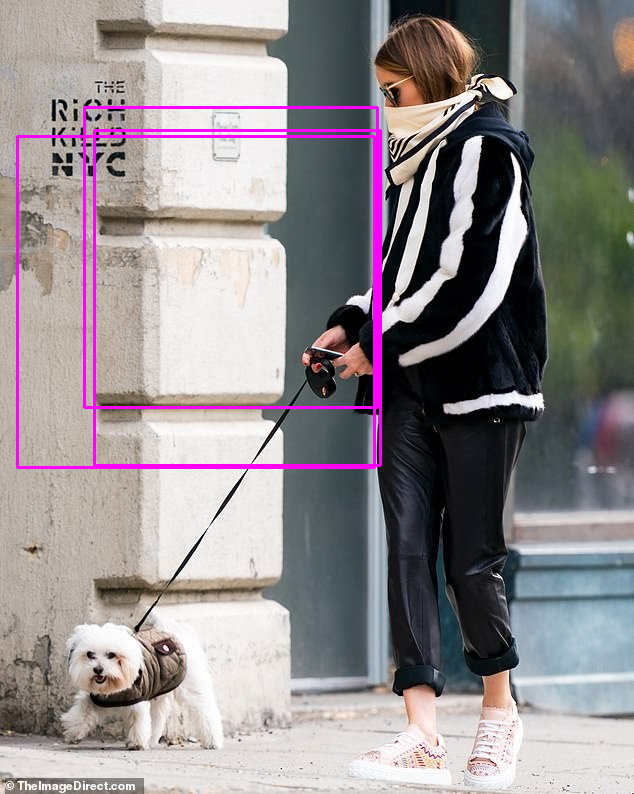

In [ ]:
# check image 
show_img(30)

In [ ]:
# No, annotation is correct it is just misplaced 
# only for this particular data *change only header x2 to y1, vice versa
train_df.rename(columns = {'x2' : 'y1', 'y1' : 'x2'}, inplace = True)

face_other_covering
scarf_bandana
sunglasses


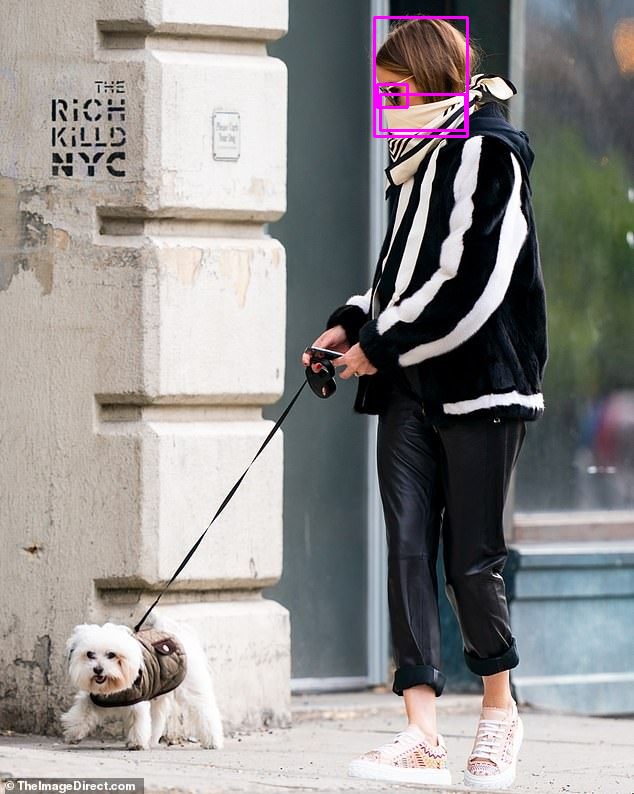

In [ ]:
# check again
show_img(30)

In [ ]:
# total classes available
print('num:',len(train_df['classname'].unique()) )
train_df['classname'].value_counts()

num: 20


face_with_mask              4180
mask_surgical               2430
mask_colorful               1876
face_no_mask                1569
face_other_covering         1372
eyeglasses                   914
hat                          823
sunglasses                   358
hair_net                     287
scarf_bandana                260
goggles                      192
helmet                       187
hijab_niqab                  173
face_shield                  160
hood                         159
face_with_mask_incorrect     150
balaclava_ski_mask           134
turban                        94
gas_mask                      55
other                         39
Name: classname, dtype: int64

In [ ]:
# we are interested only in faces with_mask and without mask
classnames = [train_df['classname'].unique()[0],train_df['classname'].unique()[2]]

cl_label = {}
for i,class_ in enumerate(classnames):
  cl_label[class_] = i

df = train_df[train_df['classname'].isin(classnames)]

print(cl_label)
print(df.head())


{'face_with_mask': 0, 'face_no_mask': 1}
        name   x1   y1   x2   y2       classname
0   2756.png   69  126  294  392  face_with_mask
1   2756.png  505   10  723  283  face_with_mask
4   6098.jpg  360   85  728  653    face_no_mask
7   4591.png  239    9  522  342  face_with_mask
11  5525.jpg  262   18  484  319    face_no_mask


In [ ]:
orig_img_path = '../facemask/Medical mask/Medical mask/Medical Mask/images/'

# get image names not annotated
imgs_test = []
img_names = train_df['name'].unique()

for dir, _, filenames in os.walk(orig_img_path):
  for files in filenames:
    if files not in img_names:
      imgs_test.append(files)

print('train imgs:',len(img_names),'\ntest imgs:',len(imgs_test))

train imgs: 4326 
test imgs: 1698


In [ ]:
  new_img_path = '../Maskdata/images/train/'
  new_lab_path = '../Maskdata/labels/train/'

In [ ]:
def create_dataset():
  '''
  creates training dataset for yolo
  '''

  if not os.path.exists(new_img_path):
    os.makedirs(new_img_path)
  if not os.path.exists(new_lab_path):
    os.makedirs(new_lab_path)
  
  img_names = list(df['name'].unique())

  for name in tqdm(img_names):
    if not os.path.exists(new_img_path+name):
      shutil.copy(orig_img_path+name,new_img_path+name)
    img = cv2.imread(orig_img_path+name)
    h, w = img.shape[:2]
    f_name = name.split('.')[0]

    with open(new_lab_path+f_name+".txt",'a+') as label:
      ldf=df.loc[df['name']==name]
      for i in range(len(ldf)):
        
        x1 = list(ldf['x1'])[i]
        y1 = list(ldf['y1'])[i]
        x2 = list(ldf['x2'])[i]
        y2 = list(ldf['y2'])[i]

        # modify annotaion format
        width = (x2-x1)/w
        height = (y2-y1)/h
        xcenter = (x1+(x2-x1)/2)/w
        ycenter = (y1+(y2-y1)/2)/h
        l = cl_label[list(ldf['classname'])[i]]

        l_data = f"{l} {xcenter} {ycenter} {width} {height}\n"
        label.write(l_data)
  

In [ ]:
create_dataset()

100%|██████████| 3390/3390 [01:08<00:00, 49.27it/s]


In [ ]:
# check created label
# %cat ../Maskdata/labels/train/4076.txt

In [ ]:
def create_conf():
  '''
  create configuration for custom dataset 
  '''
  yaml_data = {
      'train': new_img_path,
      'val': new_img_path,
      'nc':len(classnames),
      'names':classnames
  }

  with open('../Maskdata/mask.yaml','w') as f:
      yaml.dump(yaml_data, f)

  with open('models/yolov5s.yaml') as f:
      ydata = yaml.load(f, Loader=yaml.FullLoader) 
      print(ydata)

  ydata['nc'] = len(classnames)
  print(ydata)
  with open('models/yolov5_custom.yaml','w') as cy:
      yaml.dump(ydata,cy) 

In [ ]:
create_conf()

{'nc': 80, 'depth_multiple': 0.33, 'width_multiple': 0.5, 'anchors': [[10, 13, 16, 30, 33, 23], [30, 61, 62, 45, 59, 119], [116, 90, 156, 198, 373, 326]], 'backbone': [[-1, 1, 'Focus', [64, 3]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'Bottleneck', [128]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 9, 'BottleneckCSP', [256]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 9, 'BottleneckCSP', [512]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 1, 'SPP', [1024, [5, 9, 13]]], [-1, 6, 'BottleneckCSP', [1024]]], 'head': [[-1, 3, 'BottleneckCSP', [1024, False]], [-1, 1, 'nn.Conv2d', ['na * (nc + 5)', 1, 1]], [-2, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 1, 'Conv', [512, 1, 1]], [-1, 3, 'BottleneckCSP', [512, False]], [-1, 1, 'nn.Conv2d', ['na * (nc + 5)', 1, 1]], [-2, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 1, 'Conv', [256, 1, 1]], [-1, 3, 'BottleneckCSP', [256, False]], [-1, 1, 'nn.Conv2d', ['na * (nc + 5)', 1, 1]], [[], 1, 'Detect', ['nc', 'anchor

In [ ]:
# Start tensorboard
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python train.py --img 640 --batch 16 --epochs 10 --data ../Maskdata/mask.yaml --cfg ./models/yolov5_custom.yaml --weights yolov5s.pt --name FaskMasks --nosave --cache

Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov5_custom.yaml', data='../Maskdata/mask.yaml', device='', epochs=10, evolve=False, img_size=[640], multi_scale=False, name='FaskMasks', noautoanchor=False, nosave=True, notest=False, rect=False, resume=False, single_cls=False, weights='yolov5s.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

2020-06-21 10:33:39.889229: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Start Tensorboard with "tensorboard --logdir=runs", view at http://loca

In [ ]:
img = cv2.imread('test_batch0_pred.jpg')
cv2_imshow(img)

In [ ]:
img = cv2.imread('results.png')
cv2_imshow(img)

In [ ]:
%ls weights

In [ ]:
from google.colab import files
files.download(weights/last_FaceMasks.pt)